# Imports

In [ ]:
# Upload data on google drive and call it in colab
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [8]:
import pandas as pd
import seaborn as sns
import re
import sys
import nltk
from nltk.corpus import stopwords
from nltk.stem import WordNetLemmatizer
import string
import matplotlib.pyplot as plt
from wordcloud import WordCloud
import tensorflow as tf
import keras


In [9]:
from keras.preprocessing.text import Tokenizer
from keras.preprocessing.sequence import pad_sequences
from keras.models import Sequential
from keras.layers import Dense, Embedding, LSTM, SpatialDropout1D
from sklearn.model_selection import train_test_split

# Data Loading & Pre-processing

In [ ]:
# copy data file into content in colab to be used 
!cp /content/drive/MyDrive/Sentiment_Analysis/data.zip /content 

In [ ]:
# convert zip files to normal file so we can call its content 
!unzip /content/data.zip

Archive:  /content/data.zip
  inflating: training.1600000.processed.noemoticon.csv  


In [ ]:
# Importing the dataset
DATASET_COLUMNS  = ["sentiment", "ids", "date", "flag", "user", "text"]
DATASET_ENCODING = "ISO-8859-1"
dataset = pd.read_csv('/content/training.1600000.processed.noemoticon.csv',
                      encoding=DATASET_ENCODING , names=DATASET_COLUMNS)




In [ ]:
# Removing the unnecessary columns.
dataset = dataset[['sentiment','text']]
# Replacing the values to ease understanding.
dataset['sentiment'] = dataset['sentiment'].replace(4,1)

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  after removing the cwd from sys.path.


In [ ]:
dataset

,sentiment,text
0,0,"@switchfoot http://twitpic.com/2y1zl - Awww, t..."
1,0,is upset that he can't update his Facebook by ...
2,0,@Kenichan I dived many times for the ball. Man...
3,0,my whole body feels itchy and like its on fire
4,0,"@nationwideclass no, it's not behaving at all...."
...,...,...
1599995,1,Just woke up. Having no school is the best fee...
1599996,1,TheWDB.com - Very cool to hear old Walt interv...
1599997,1,Are you ready for your MoJo Makeover? Ask me f...
1599998,1,Happy 38th Birthday to my boo of alll time!!! ...


/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


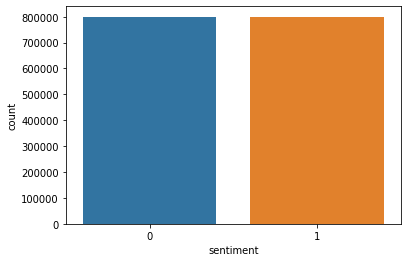

In [ ]:
sns.countplot(dataset['sentiment'])

In [ ]:
dataset.isnull().sum()

sentiment    0
text         0
dtype: int64

In [ ]:
dataset.dtypes

sentiment     int64
text         object
dtype: object

In [13]:
nltk.download('stopwords')

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.


True

In [14]:
def preprocess(textdata):
    processedText = []

    # Defining dictionary containing all emojis with their meanings.
    emojis = {':)': 'smile', ':-)': 'smile', ';d': 'wink', ':-E': 'vampire', ':(': 'sad', 
          ':-(': 'sad', ':-<': 'sad', ':P': 'raspberry', ':O': 'surprised',
          ':-@': 'shocked', ':@': 'shocked',':-$': 'confused', ':\\': 'annoyed', 
          ':#': 'mute', ':X': 'mute', ':^)': 'smile', ':-&': 'confused', '$_$': 'greedy',
          '@@': 'eyeroll', ':-!': 'confused', ':-D': 'smile', ':-0': 'yell', 'O.o': 'confused',
          '<(-_-)>': 'robot', 'd[-_-]b': 'dj', ":'-)": 'sadsmile', ';)': 'wink', 
          ';-)': 'wink', 'O:-)': 'angel','O*-)': 'angel','(:-D': 'gossip', '=^.^=': 'cat'}
    stopwords_english = stopwords.words('english')
    # Create Lemmatizer and Stemmer.
    wordLemm = WordNetLemmatizer()
    
    # Defining regex patterns.
    urlPattern        = r"((http://)[^ ]*|(https://)[^ ]*|( www\.)[^ ]*)"
    userPattern       = '@[^\s]+'
    alphaPattern      = "[^a-zA-Z0-9]"
    sequencePattern   = r"(.)\1\1+"
    seqReplacePattern = r"\1\1"
    
    for tweet in textdata:
        tweet = tweet.lower()
        
        # Replace all URls with 'URL'
        tweet = re.sub(urlPattern,' URL',tweet)
        # Replace all emojis.
        for emoji in emojis.keys():
            tweet = tweet.replace(emoji, "EMOJI" + emojis[emoji])        
        # Replace @USERNAME to 'USER'.
        tweet = re.sub(userPattern,' USER', tweet)        
        # Replace all non alphabets.
        tweet = re.sub(alphaPattern, " ", tweet)
        # Replace 3 or more consecutive letters by 2 letter.
        tweet = re.sub(sequencePattern, seqReplacePattern, tweet)

        tweetwords = ''
        for word in tweet.split():
            # Checking if the word is a stopword.
            #if word not in stopwordlist:
            if (word not in stopwords_english):
                # Lemmatizing the word.
                word = wordLemm.lemmatize(word)
                tweetwords += (word+' ')
            
        processedText.append(tweetwords)

        
    return processedText

In [15]:
def extract_feature(process_text):
      df = pd.DataFrame (process_text, columns = ['text'])
      max_fatures = 5000
      tokenizer = Tokenizer(num_words=max_fatures, split=' ')
      tokenizer.fit_on_texts(df['text'].values)
      to_seq = tokenizer.texts_to_sequences(df['text'].values)
      pad_seq = pad_sequences(to_seq) # to make words at the same length 
      return pad_seq

In [ ]:
# Storing data in lists.
text, sentiment = list(dataset['text']), list(dataset['sentiment'])

In [19]:
nltk.download('wordnet')

[nltk_data] Downloading package wordnet to /root/nltk_data...
[nltk_data]   Unzipping corpora/wordnet.zip.


True

In [ ]:
import time
t = time.time()
processed_text = preprocess(text)
print(f'Text Preprocessing complete.')
print(f'Time Taken: {round(time.time()-t)} seconds')

Text Preprocessing complete.
Time Taken: 159 seconds


In [ ]:
extracted_text = extract_feature(processed_text)

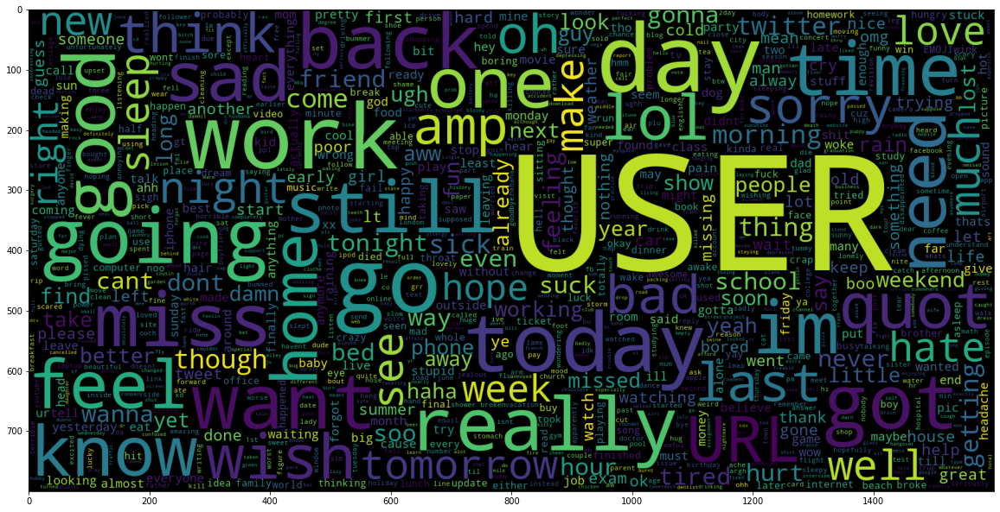

In [ ]:
data_neg = processed_text[:800000]
plt.figure(figsize = (20,20))
wc = WordCloud(max_words = 1000 , width = 1600 , height = 800,
               collocations=False).generate(" ".join(data_neg))
plt.imshow(wc)

# Tensorboard

In [ ]:
%load_ext tensorboard
%tensorboard --logdir logs

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


<IPython.core.display.Javascript object>

In [ ]:
tb_callbacks = tf.keras.callbacks.TensorBoard(log_dir="logs/",histogram_freq=1)

In [ ]:
pip install neptune-client

In [ ]:
import neptune.new as neptune

In [ ]:
run = neptune.init(api_token='ANONYMOUS',
                   project='common/quickstarts') # credentials

https://app.neptune.ai/common/quickstarts/e/QUI-74637
Remember to stop your run once you’ve finished logging your metadata (https://docs.neptune.ai/api-reference/run#stop). It will be stopped automatically only when the notebook kernel/interactive console is terminated.


In [ ]:
class NeptuneMonitor(keras.callbacks.Callback):
     def on_epoch_end(self, epoch, logs=None):
          for metric_name, metric_value in logs.items():
              run["train/{}".format(metric_name)].log(metric_value)

# Modeling & Evaluating

In [ ]:
model = Sequential()
model.add(Embedding(5000, 120, input_length = extracted_text.shape[1]))
model.add(SpatialDropout1D(0.4))
model.add(LSTM(196, dropout=0.2, recurrent_dropout=0.2))
model.add(Dense(2,activation='softmax'))
model.compile(loss = 'categorical_crossentropy', optimizer='adam', metrics = ['accuracy'])
print(model.summary())

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 embedding (Embedding)       (None, 48, 120)           600000    
                                                                 
 spatial_dropout1d (SpatialD  (None, 48, 120)          0         
 ropout1D)                                                       
                                                                 
 lstm (LSTM)                 (None, 196)               248528    
                                                                 
 dense (Dense)               (None, 2)                 394       
                                                                 
Total params: 848,922
Trainable params: 848,922
Non-trainable params: 0
_________________________________________________________________
None


In [ ]:
#Splitting the data into training and testing
y=pd.get_dummies(sentiment)
X_train, X_test, y_train, y_test = train_test_split(extracted_text,y, test_size = 0.2, random_state = 42)

In [ ]:
from keras.callbacks import ModelCheckpoint,EarlyStopping
checkpointer = ModelCheckpoint('Sentiment_Analysis_LSTM.hdf5', monitor='val_loss', verbose=1, save_best_only=True)
ES= EarlyStopping(monitor='val_loss', mode='min', verbose=1)

In [ ]:
history = model.fit(X_train,
                    y_train,
                    batch_size=32,
                    callbacks=[checkpointer,ES,tb_callbacks],
                    epochs = 3,
                    verbose = 1,
                    shuffle=False,
                    validation_data=(X_test, y_test))

Epoch 1/3
40000/40000 [==============================] - ETA: 0s - loss: 0.4684 - accuracy: 0.7751
Epoch 00001: val_loss improved from inf to 0.45151, saving model to Sentiment_Analysis_LSTM.hdf5
40000/40000 [==============================] - 11191s 280ms/step - loss: 0.4684 - accuracy: 0.7751 - val_loss: 0.4515 - val_accuracy: 0.7854
Epoch 2/3
40000/40000 [==============================] - ETA: 0s - loss: 0.4498 - accuracy: 0.7863
Epoch 00002: val_loss improved from 0.45151 to 0.44721, saving model to Sentiment_Analysis_LSTM.hdf5
40000/40000 [==============================] - 11358s 284ms/step - loss: 0.4498 - accuracy: 0.7863 - val_loss: 0.4472 - val_accuracy: 0.7883
Epoch 00002: early stopping


# Prediction Function

In [21]:
from tensorflow.keras.models import load_model

In [22]:
model = load_model('/content/Sentiment_Analysis_LSTM.hdf5',compile = False)

In [30]:
def prdeiction_fun(sample_input):
    df = pd.DataFrame (sample_input, columns = ['text'])
    processed_text = preprocess(df)
    extracted_text = extract_feature( processed_text)
    prediction_text = model.predict(extracted_text)
    print(prediction_text)

In [31]:
test_input = ["Free Webinar on Big Data &amp; Data Science With Artificial Intelligence\n\nFill Google Form and Join USƒ?? https://t.co/sr7v4xSVYo"]

In [32]:
prdeiction_fun(test_input)  # first argument is loss & second argument is accuarcy 

[[0.33976623 0.66023374]]
